**Install Packages**

In [ ]:
!pip install uv
!uv pip install kaggle --system
!uv pip install umap-learn --system

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 87.2 MB/s eta 0:00:00
Using Python 3.10.12 environment at /usr
Audited 1 package in 63ms
Using Python 3.10.12 environment at /usr
Resolved 10 packages in 176ms
⠙ Preparing packages... (0/2)
⠙ Preparing packages... (0/2)
⠙ Preparing packages... (0/2)
pynndescent ------------------------------ 14.91 KiB/55.52 KiB
⠙ Preparing packages... (0/2)
pynndescent ------------------------------ 14.91 KiB/55.52 KiB
⠙ Preparing packages... (0/2)
pynndescent ------------------------------ 30.91 KiB/55.52 KiB
⠙ Preparing packages... (0/2)
pynndescent ------------------------------ 46.91 KiB/55.52 KiB
⠙ Preparing packages... (0/2)
pynndescent ------------------------------ 46.91 KiB/55.52 KiB
⠙ Preparing packages... (0/2)
pynndescent ------------------------------ 46.91 KiB/55.52 KiB
⠙ Preparing packages... (0/2)
pynndescent ------------------------------ 55.52 KiB/55.52 KiB
⠙ Preparing packages... (0/2)
pynndescent ------------------------------

**Import Libraries**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

In [ ]:
from sklearn.decomposition import FactorAnalysis, IncrementalPCA, KernelPCA, PCA
from sklearn.manifold import Isomap, LocallyLinearEmbedding, MDS, TSNE
from umap import UMAP

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
label_encoder = LabelEncoder()
standard_scaler = StandardScaler()

In [ ]:
import ipywidgets as widgets

from google.colab import output
output.enable_custom_widget_manager()

**Download Datasets**

In [ ]:
# Mount Google drive and copy kaggle.json to local disk

from google.colab import drive
drive.mount('mount')

!cp mount/MyDrive/kaggle.json .

Mounted at mount


In [ ]:
# Download Tabular Datasets
!KAGGLE_CONFIG_DIR=$(pwd) kaggle competitions download -c spaceship-titanic
!KAGGLE_CONFIG_DIR=$(pwd) kaggle datasets download aayushkandpal/air-quality-time-series-data-uci
!KAGGLE_CONFIG_DIR=$(pwd) kaggle datasets download rabieelkharoua/students-performance-dataset
!KAGGLE_CONFIG_DIR=$(pwd) kaggle datasets download syedanwarafridi/vehicle-sales-data
!KAGGLE_CONFIG_DIR=$(pwd) kaggle datasets download uciml/red-wine-quality-cortez-et-al-2009

100% 299k/299k [00:00<00:00, 867kB/s]
100% 299k/299k [00:00<00:00, 866kB/s]
Dataset URL: https://www.kaggle.com/datasets/aayushkandpal/air-quality-time-series-data-uci
License(s): CC0-1.0
 81% 1.00M/1.23M [00:00<00:00, 1.97MB/s]
100% 1.23M/1.23M [00:00<00:00, 2.31MB/s]
Dataset URL: https://www.kaggle.com/datasets/rabieelkharoua/students-performance-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
100% 66.2k/66.2k [00:00<00:00, 636kB/s]
100% 66.2k/66.2k [00:00<00:00, 634kB/s]
Dataset URL: https://www.kaggle.com/datasets/syedanwarafridi/vehicle-sales-data
License(s): MIT
 90% 17.0M/18.8M [00:01<00:00, 27.3MB/s]
100% 18.8M/18.8M [00:01<00:00, 18.3MB/s]
Dataset URL: https://www.kaggle.com/datasets/uciml/red-wine-quality-cortez-et-al-2009
License(s): DbCL-1.0
  0% 0.00/25.6k [00:00<?, ?B/s]
100% 25.6k/25.6k [00:00<00:00, 12.4MB/s]


In [ ]:
# Extract Tabular Datasets
!unzip -o air-quality-time-series-data-uci.zip -d air-quality-time-series-data-uci
!unzip -o red-wine-quality-cortez-et-al-2009.zip -d red-wine-quality-cortez-et-al-2009
!unzip -o spaceship-titanic.zip -d spaceship-titanic
!unzip -o students-performance-dataset.zip -d students-performance-dataset
!unzip -o vehicle-sales-data.zip -d vehicle-sales-data

Archive:  air-quality-time-series-data-uci.zip
  inflating: air-quality-time-series-data-uci/AirQualityUCI.xlsx  
Archive:  red-wine-quality-cortez-et-al-2009.zip
  inflating: red-wine-quality-cortez-et-al-2009/winequality-red.csv  
Archive:  spaceship-titanic.zip
  inflating: spaceship-titanic/sample_submission.csv  
  inflating: spaceship-titanic/test.csv  
  inflating: spaceship-titanic/train.csv  
Archive:  students-performance-dataset.zip
  inflating: students-performance-dataset/Student_performance_data _.csv  
Archive:  vehicle-sales-data.zip
  inflating: vehicle-sales-data/car_prices.csv  


**Load and Prepare Datasets**

In [ ]:
air_quality_df = pd.read_excel('air-quality-time-series-data-uci/AirQualityUCI.xlsx')

air_quality_df.drop(columns = ['NMHC(GT)', 'NO2(GT)'], inplace = True)

# for index, value in air_quality_df['Date'].items():
    # air_quality_df.loc[index, 'Date'] = air_quality_df['Date'][index].replace(hour=air_quality_df['Time'][index].hour)

air_quality_df.drop(['Date', 'Time'], axis=1, inplace=True)

def impute_missing_time_series_values(column_name):
    for index, value in air_quality_df[column_name].items():
        if value == -200:
            air_quality_df.loc[index, column_name] = air_quality_df.loc[index - 1, column_name]

for column_name in air_quality_df.columns.tolist():
    impute_missing_time_series_values(column_name)

air_quality_df_orig = air_quality_df
air_quality_df_orig

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360.00,11.881723,1045.50,166.0,1056.25,1692.00,1267.50,13.600,48.875001,0.757754
1,2.0,1292.25,9.397165,954.75,103.0,1173.75,1558.75,972.25,13.300,47.700000,0.725487
2,2.2,1402.00,8.997817,939.25,131.0,1140.00,1554.50,1074.00,11.900,53.975000,0.750239
3,2.2,1375.50,9.228796,948.25,172.0,1092.00,1583.75,1203.25,11.000,60.000000,0.786713
4,1.6,1272.25,6.518224,835.50,131.0,1205.00,1490.00,1110.00,11.150,59.575001,0.788794
...,...,...,...,...,...,...,...,...,...,...,...
9352,3.1,1314.25,13.529605,1101.25,471.7,538.50,1374.25,1728.50,21.850,29.250000,0.756824
9353,2.4,1162.50,11.355157,1027.00,353.3,603.75,1263.50,1269.00,24.325,23.725000,0.711864
9354,2.4,1142.00,12.374538,1062.50,293.0,603.25,1240.75,1092.00,26.900,18.350000,0.640649
9355,2.1,1002.50,9.547187,960.50,234.5,701.50,1041.00,769.75,28.325,13.550000,0.513866


In [ ]:
air_quality_df = pd.DataFrame(standard_scaler.fit_transform(air_quality_df), columns=air_quality_df.columns)
air_quality_df

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,0.352315,1.172176,0.223597,0.382378,-0.361656,0.874616,0.688266,0.577077,-0.534521,0.003466,-0.641362
1,-0.055926,0.863643,-0.104848,0.045730,-0.666592,1.334155,0.304712,-0.141496,-0.568525,-0.064243,-0.721070
2,0.080154,1.363443,-0.157640,-0.011770,-0.531065,1.202160,0.292479,0.106141,-0.727211,0.297354,-0.659926
3,0.080154,1.242763,-0.127105,0.021617,-0.332614,1.014433,0.376673,0.420706,-0.829224,0.644545,-0.569825
4,-0.328086,0.772564,-0.485428,-0.396644,-0.531065,1.456373,0.106818,0.193757,-0.812222,0.620054,-0.564683
...,...,...,...,...,...,...,...,...,...,...,...
9352,0.692515,0.963831,0.441438,0.589190,1.118014,-1.150289,-0.226363,1.699047,0.400596,-1.127426,-0.643658
9353,0.216235,0.272764,0.153988,0.313750,0.544926,-0.895098,-0.545151,0.580727,0.681131,-1.445804,-0.754725
9354,0.216235,0.179407,0.288745,0.445442,0.253058,-0.897054,-0.610636,0.149949,0.973001,-1.755539,-0.930648
9355,0.012114,-0.455874,-0.085016,0.067060,-0.030097,-0.512801,-1.185607,-0.634336,1.134521,-2.032139,-1.243841


In [ ]:
red_wine_quality_df_orig = pd.read_csv('red-wine-quality-cortez-et-al-2009/winequality-red.csv')
red_wine_quality_df_orig

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
red_wine_quality_df = pd.DataFrame(standard_scaler.fit_transform(red_wine_quality_df_orig), columns=red_wine_quality_df_orig.columns)
red_wine_quality_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,-0.787823
1,-0.298547,1.967442,-1.391472,0.043416,0.223875,0.872638,0.624363,0.028261,-0.719933,0.128950,-0.584777,-0.787823
2,-0.298547,1.297065,-1.186070,-0.169427,0.096353,-0.083669,0.229047,0.134264,-0.331177,-0.048089,-0.584777,-0.787823
3,1.654856,-1.384443,1.484154,-0.453218,-0.264960,0.107592,0.411500,0.664277,-0.979104,-0.461180,-0.584777,0.450848
4,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,-0.787823
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,-1.217796,0.403229,-0.980669,-0.382271,0.053845,1.542054,-0.075043,-0.978765,0.899886,-0.461180,0.072294,-0.787823
1595,-1.390155,0.123905,-0.877968,-0.240375,-0.541259,2.211469,0.137820,-0.862162,1.353436,0.601055,0.729364,0.450848
1596,-1.160343,-0.099554,-0.723916,-0.169427,-0.243707,1.255161,-0.196679,-0.533554,0.705508,0.542042,0.541630,0.450848
1597,-1.390155,0.654620,-0.775267,-0.382271,-0.264960,1.542054,-0.075043,-0.676657,1.677400,0.305990,-0.209308,-0.787823


In [ ]:
spaceship_titanic_df_orig = pd.read_csv('spaceship-titanic/train.csv')

spaceship_titanic_df_orig = spaceship_titanic_df_orig.drop(['PassengerId', 'Name', 'Cabin'], axis=1)

label_encoder = LabelEncoder()
spaceship_titanic_df_orig['HomePlanet'] = label_encoder.fit_transform(spaceship_titanic_df_orig['HomePlanet'])
spaceship_titanic_df_orig['Destination'] = label_encoder.fit_transform(spaceship_titanic_df_orig['Destination'])
spaceship_titanic_df_orig.dropna(inplace=True)

spaceship_titanic_df_orig

,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,1,False,2,39.0,False,0.0,0.0,0.0,0.0,0.0,False
1,0,False,2,24.0,False,109.0,9.0,25.0,549.0,44.0,True
2,1,False,2,58.0,True,43.0,3576.0,0.0,6715.0,49.0,False
3,1,False,2,33.0,False,0.0,1283.0,371.0,3329.0,193.0,False
4,0,False,2,16.0,False,303.0,70.0,151.0,565.0,2.0,True
...,...,...,...,...,...,...,...,...,...,...,...
8688,1,False,0,41.0,True,0.0,6819.0,0.0,1643.0,74.0,False
8689,0,True,1,18.0,False,0.0,0.0,0.0,0.0,0.0,False
8690,0,False,2,26.0,False,0.0,0.0,1872.0,1.0,0.0,True
8691,1,False,0,32.0,False,0.0,1049.0,0.0,353.0,3235.0,False


In [ ]:
spaceship_titanic_df = pd.DataFrame(standard_scaler.fit_transform(spaceship_titanic_df_orig), columns=spaceship_titanic_df_orig.columns)
spaceship_titanic_df = spaceship_titanic_df.drop(['Transported'], axis=1)
spaceship_titanic_df

,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
0,0.319749,-0.736727,0.578638,0.695597,-0.157722,-0.338405,-0.287309,-0.284134,-0.272701,-0.271222
1,-0.835458,-0.736727,0.578638,-0.340099,-0.157722,-0.175072,-0.281839,-0.244036,0.198166,-0.231773
2,0.319749,-0.736727,0.578638,2.007478,6.340257,-0.273971,1.886266,-0.284134,5.486631,-0.227290
3,0.319749,-0.736727,0.578638,0.281318,-0.157722,-0.338405,0.492528,0.310920,2.582521,-0.098186
4,-0.835458,-0.736727,0.578638,-0.892471,-0.157722,0.115631,-0.244762,-0.041942,0.211889,-0.269429
...,...,...,...,...,...,...,...,...,...,...
7246,0.319749,-0.736727,-1.797857,0.833689,6.340257,-0.338405,3.857436,-0.284134,1.136470,-0.204876
7247,-0.835458,1.357356,-0.609610,-0.754378,-0.157722,-0.338405,-0.287309,-0.284134,-0.272701,-0.271222
7248,-0.835458,-0.736727,0.578638,-0.202007,-0.157722,-0.338405,-0.287309,2.718404,-0.271843,-0.271222
7249,0.319749,-0.736727,-1.797857,0.212272,-0.157722,-0.338405,0.350297,-0.284134,0.030061,2.629144


In [ ]:
student_performance_df_orig = pd.read_csv('students-performance-dataset/Student_performance_data _.csv')
student_performance_df_orig

,StudentID,Age,Gender,Ethnicity,ParentalEducation,StudyTimeWeekly,Absences,Tutoring,ParentalSupport,Extracurricular,Sports,Music,Volunteering,GPA,GradeClass
0,1001,17,1,0,2,19.833723,7,1,2,0,0,1,0,2.929196,2.0
1,1002,18,0,0,1,15.408756,0,0,1,0,0,0,0,3.042915,1.0
2,1003,15,0,2,3,4.210570,26,0,2,0,0,0,0,0.112602,4.0
3,1004,17,1,0,3,10.028829,14,0,3,1,0,0,0,2.054218,3.0
4,1005,17,1,0,2,4.672495,17,1,3,0,0,0,0,1.288061,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,3388,18,1,0,3,10.680555,2,0,4,1,0,0,0,3.455509,0.0
2388,3389,17,0,0,1,7.583217,4,1,4,0,1,0,0,3.279150,4.0
2389,3390,16,1,0,2,6.805500,20,0,2,0,0,0,1,1.142333,2.0
2390,3391,16,1,1,0,12.416653,17,0,2,0,1,1,0,1.803297,1.0


In [ ]:
student_performance_df = student_performance_df_orig.drop(['StudentID', 'GradeClass'], axis=1)
student_performance_df = pd.DataFrame(standard_scaler.fit_transform(student_performance_df), columns=student_performance_df.columns)
student_performance_df

,Age,Gender,Ethnicity,ParentalEducation,StudyTimeWeekly,Absences,Tutoring,ParentalSupport,Extracurricular,Sports,Music,Volunteering,GPA
0,0.472919,0.978492,-0.853391,0.253711,1.780336,-0.890822,1.522371,-0.108744,-0.788476,-0.660132,2.019544,-0.431866,1.118086
1,1.362944,-1.021981,-0.853391,-0.746087,0.997376,-1.717694,-0.656870,-0.999551,-0.788476,-0.660132,-0.495161,-0.431866,1.242374
2,-1.307132,-1.021981,1.091641,1.253509,-0.984045,1.353542,-0.656870,-0.108744,-0.788476,-0.660132,-0.495161,-0.431866,-1.960277
3,0.472919,0.978492,-0.853391,1.253509,0.045445,-0.063951,-0.656870,0.782063,1.268269,-0.660132,-0.495161,-0.431866,0.161790
4,0.472919,0.978492,-0.853391,0.253711,-0.902311,0.290422,1.522371,0.782063,-0.788476,-0.660132,-0.495161,-0.431866,-0.675573
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2387,1.362944,0.978492,-0.853391,1.253509,0.160762,-1.481445,-0.656870,1.672869,1.268269,-0.660132,-0.495161,-0.431866,1.693315
2388,0.472919,-1.021981,-0.853391,-0.746087,-0.387285,-1.245196,1.522371,1.672869,-0.788476,1.514848,-0.495161,-0.431866,1.500565
2389,-0.417106,0.978492,-0.853391,0.253711,-0.524895,0.644796,-0.656870,-0.108744,-0.788476,-0.660132,-0.495161,2.315535,-0.834845
2390,-0.417106,0.978492,0.119125,-1.745885,0.467950,0.290422,-0.656870,-0.108744,-0.788476,1.514848,2.019544,-0.431866,-0.112452


In [ ]:
vehicle_sales_df_orig = pd.read_csv('vehicle-sales-data/car_prices.csv')

# def month_to_num(month):
#     month_dict = {
#         'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04',
#         'May': '05', 'Jun': '06', 'Jul': '07', 'Aug': '08',
#         'Sep': '09', 'Oct': '10', 'Nov': '11', 'Dec': '12'
#     }
#     return month_dict.get(month)

# vehicle_sales_df['saledate'] = pd.to_datetime(vehicle_sales_df['saledate'].str.split(" ").apply(lambda l: "{year}-{month}-{day}".format(year=l[3], month=month_to_num(l[1]), day=l[2]) if isinstance(l, list) and len(l) >= 4 else np.nan))
# vehicle_sales_df.dropna(subset=['saledate'], axis=0, inplace=True)

vehicle_sales_df_orig.drop(['saledate'], axis=1, inplace=True)

vehicle_sales_df_orig['transmission'] = vehicle_sales_df_orig['transmission'].fillna('automatic')
vehicle_sales_df_orig.groupby('transmission').size()

vehicle_sales_df_orig['color'] = vehicle_sales_df_orig['color'].replace('—', np.nan)
vehicle_sales_df_orig['interior'] = vehicle_sales_df_orig['interior'].replace('—', np.nan)

vehicle_sales_df_orig.dropna(inplace=True)
vehicle_sales_df_orig.drop(['vin', 'seller'], axis=1, inplace=True)

vehicle_sales_df_orig['body'] = vehicle_sales_df_orig['body'].str.lower()
vehicle_sales_df_orig['trim'] = vehicle_sales_df_orig['trim'].str.lower()
vehicle_sales_df_orig['make'] = vehicle_sales_df_orig['make'].str.lower()
vehicle_sales_df_orig['model'] = vehicle_sales_df_orig['model'].str.lower()

vehicle_sales_df_orig = vehicle_sales_df_orig.sample(n=10_000, random_state=42)
vehicle_sales_df_orig

,year,make,model,trim,body,transmission,state,condition,odometer,color,interior,mmr,sellingprice
142412,2012,volkswagen,gli,base,sedan,automatic,ga,45.0,33593.0,gray,black,13500.0,15000.0
351788,2012,buick,regal,base,sedan,automatic,mi,49.0,50771.0,black,black,13700.0,13600.0
146717,2013,chevrolet,suburban,ltz 1500,suv,automatic,ca,39.0,63529.0,white,black,31000.0,12800.0
400240,2011,infiniti,g coupe,g37,g coupe,automatic,ga,3.0,33382.0,gray,black,19800.0,18600.0
170569,2010,chevrolet,camaro,1lt,coupe,automatic,tn,35.0,43934.0,black,black,14900.0,15800.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
53154,2012,hyundai,sonata,gls,sedan,automatic,pa,43.0,29137.0,blue,gray,11800.0,11600.0
191530,2014,ford,fusion,se,sedan,automatic,tn,39.0,39548.0,white,tan,14650.0,14500.0
439584,2012,subaru,impreza,2.0i limited pzev,hatchback,automatic,fl,44.0,24789.0,silver,black,17050.0,16500.0
217645,2008,honda,civic,ex,sedan,automatic,ga,36.0,115586.0,white,beige,6200.0,6800.0


In [ ]:
vehicle_sales_df = vehicle_sales_df_orig.copy()

vehicle_sales_df['make'] = label_encoder.fit_transform(vehicle_sales_df['make'])
vehicle_sales_df['model'] = label_encoder.fit_transform(vehicle_sales_df['model'])
vehicle_sales_df['trim'] = label_encoder.fit_transform(vehicle_sales_df['trim'])
vehicle_sales_df['body'] = label_encoder.fit_transform(vehicle_sales_df['body'])
vehicle_sales_df['transmission'] = label_encoder.fit_transform(vehicle_sales_df['transmission'])
vehicle_sales_df['state'] = label_encoder.fit_transform(vehicle_sales_df['state'])
vehicle_sales_df['color'] = label_encoder.fit_transform(vehicle_sales_df['color'])
vehicle_sales_df['interior'] = label_encoder.fit_transform(vehicle_sales_df['interior'])

vehicle_sales_df = pd.DataFrame(standard_scaler.fit_transform(vehicle_sales_df), columns=vehicle_sales_df.columns)
vehicle_sales_df

,year,make,model,trim,body,transmission,state,condition,odometer,color,interior,mmr,sellingprice
0,0.476135,2.019645,-0.109105,-1.069043,0.297128,-0.180641,-0.879857,1.070472,-0.642063,-0.189424,-0.703035,-0.032046,0.142991
1,0.476135,-1.111011,0.963956,-1.069043,0.297128,-0.180641,-0.245249,1.370532,-0.316422,-1.270505,-0.703035,-0.010309,-0.008015
2,0.739776,-0.941786,1.425780,0.209526,0.679205,-0.180641,-1.151832,0.620382,-0.074570,1.252019,-0.703035,1.869931,-0.094305
3,0.212494,-0.180275,-0.204187,-0.412786,-1.485897,-0.180641,-0.879857,-2.080159,-0.646063,-0.189424,-0.703035,0.652666,0.531295
4,-0.051146,-0.941786,-1.080294,-1.861077,-2.759487,-0.180641,1.386601,0.320322,-0.446030,-1.270505,-0.703035,0.120113,0.229281
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.476135,-0.264887,1.330699,-0.310953,0.297128,-0.180641,1.023968,0.920442,-0.726535,-1.090325,0.641303,-0.216809,-0.223739
9996,1.003416,-0.603337,-0.251727,0.775265,0.297128,-0.180641,1.386601,0.620382,-0.529175,1.252019,2.523375,0.092941,0.089060
9997,0.476135,1.765808,0.094641,-1.821476,-0.976461,-0.180641,-0.970516,0.995457,-0.808960,0.891658,-0.703035,0.353784,0.304784
9998,-0.578428,-0.434112,-0.951255,-0.525934,0.297128,-0.180641,-0.879857,0.395337,0.912268,1.252019,-0.971902,-0.825442,-0.741477


<h1>Dimensionality Reduction: Factor Analysis, Randomized PCA, Kernel PCA, Incremental PCA</h1>

**Factor Analysis**

In [ ]:
# Factor Analysis - 2D
factor_2c = FactorAnalysis(n_components=2, max_iter=2000)

red_wine_quality_factor_2c = factor_2c.fit_transform(red_wine_quality_df)
spaceship_titanic_factor_2c = factor_2c.fit_transform(spaceship_titanic_df)
student_performance_factor_2c = factor_2c.fit_transform(student_performance_df)
vehicle_sales_factor_2c = factor_2c.fit_transform(vehicle_sales_df)

# Factor Analysis - 3D
factor_3c = FactorAnalysis(n_components=3, max_iter=2000)

red_wine_quality_factor_3c = factor_3c.fit_transform(red_wine_quality_df)
spaceship_titanic_factor_3c = factor_3c.fit_transform(spaceship_titanic_df)
student_performance_factor_3c = factor_3c.fit_transform(student_performance_df)
vehicle_sales_factor_3c = factor_3c.fit_transform(vehicle_sales_df)

**Randomized PCA**

In [ ]:
# Randomized PCA - 2D
randomized_pca_2c = PCA(svd_solver='randomized', n_components=2)

red_wine_quality_randomized_pca_2c = randomized_pca_2c.fit_transform(red_wine_quality_df)
spaceship_titanic_randomized_pca_2c = randomized_pca_2c.fit_transform(spaceship_titanic_df)
student_performance_randomized_pca_2c = randomized_pca_2c.fit_transform(student_performance_df)
vehicle_sales_randomized_pca_2c = randomized_pca_2c.fit_transform(vehicle_sales_df)

# Randomized PCA - 3D
randomized_pca_3c = PCA(svd_solver='randomized', n_components=3)

red_wine_quality_randomized_pca_3c = randomized_pca_3c.fit_transform(red_wine_quality_df)
spaceship_titanic_randomized_pca_3c = randomized_pca_3c.fit_transform(spaceship_titanic_df)
student_performance_randomized_pca_3c = randomized_pca_3c.fit_transform(student_performance_df)
vehicle_sales_randomized_pca_3c = randomized_pca_3c.fit_transform(vehicle_sales_df)

**Kernel PCA**

In [ ]:
# Kernel PCA - 2D
kernel_pca_2c = KernelPCA(n_components=2)

red_wine_quality_kernel_pca_2c = kernel_pca_2c.fit_transform(red_wine_quality_df)
spaceship_titanic_kernel_pca_2c = kernel_pca_2c.fit_transform(spaceship_titanic_df)
student_performance_kernel_pca_2c = kernel_pca_2c.fit_transform(student_performance_df)
vehicle_sales_kernel_pca_2c = kernel_pca_2c.fit_transform(vehicle_sales_df)

# Kernel PCA - 3D
kernel_pca_3c = KernelPCA(n_components=3)

red_wine_quality_kernel_pca_3c = kernel_pca_3c.fit_transform(red_wine_quality_df)
spaceship_titanic_kernel_pca_3c = kernel_pca_3c.fit_transform(spaceship_titanic_df)
student_performance_kernel_pca_3c = kernel_pca_3c.fit_transform(student_performance_df)
vehicle_sales_kernel_pca_3c = kernel_pca_3c.fit_transform(vehicle_sales_df)

**Incremental PCA**

In [ ]:
# Incremental PCA - 2D
incremental_pca_2c = IncrementalPCA(n_components=2)

red_wine_quality_incremental_pca_2c = incremental_pca_2c.fit_transform(red_wine_quality_df)
spaceship_titanic_incremental_pca_2c = incremental_pca_2c.fit_transform(spaceship_titanic_df)
student_performance_incremental_pca_2c = incremental_pca_2c.fit_transform(student_performance_df)
vehicle_sales_incremental_pca_2c = incremental_pca_2c.fit_transform(vehicle_sales_df)

# Incremental PCA - 3D
incremental_pca_3c = IncrementalPCA(n_components=3)

red_wine_quality_incremental_pca_3c = incremental_pca_3c.fit_transform(red_wine_quality_df)
spaceship_titanic_incremental_pca_3c = incremental_pca_3c.fit_transform(spaceship_titanic_df)
student_performance_incremental_pca_3c = incremental_pca_3c.fit_transform(student_performance_df)
vehicle_sales_incremental_pca_3c = incremental_pca_3c.fit_transform(vehicle_sales_df)

<h1>Visualizations: Factor Analysis, Randomized PCA, Kernel PCA, Incremental PCA</h1>

In [ ]:
colors = np.array(["blue", "red", "yellow", "purple", "orange", "green"])

**Red Wine Quality**

In [ ]:
print("Red Wine Qualities: " + str(red_wine_quality_df_orig['quality'].unique()))
red_wine_quality_z = np.array(red_wine_quality_df_orig['quality'].map(lambda quality: 0 if quality < 7 else 1), dtype=np.int8)
red_wine_quality_point_colors = colors[red_wine_quality_z]
print("Red Wine Point Colors: " + str(pd.Series(red_wine_quality_point_colors).unique()))

Red Wine Qualities: [5 6 7 4 8 3]
Red Wine Point Colors: ['blue' 'red']


**Red Wine Quality - 2D**

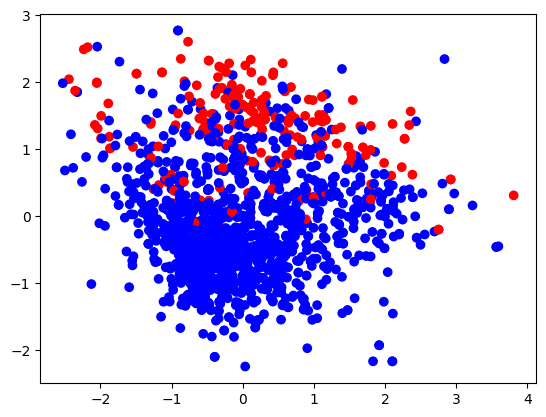

In [ ]:
plt.scatter(red_wine_quality_factor_2c[:,0], red_wine_quality_factor_2c[:,1], c=red_wine_quality_point_colors)

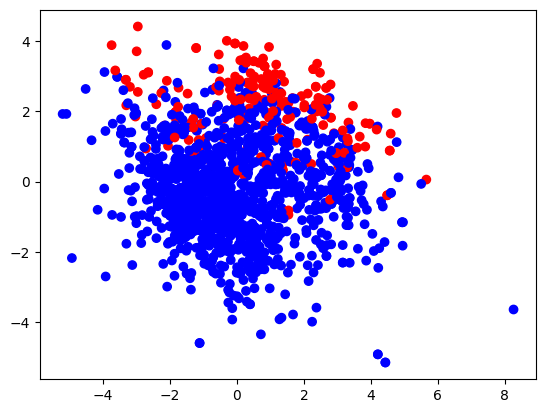

In [ ]:
plt.scatter(red_wine_quality_randomized_pca_2c[:,0], red_wine_quality_randomized_pca_2c[:,1], c=red_wine_quality_point_colors)

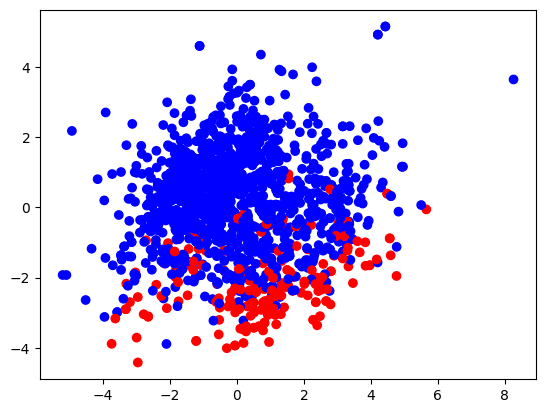

In [ ]:
plt.scatter(red_wine_quality_kernel_pca_2c[:,0], red_wine_quality_kernel_pca_2c[:,1], c=red_wine_quality_point_colors)

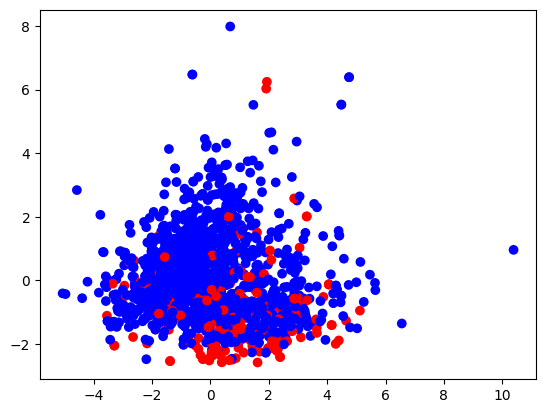

In [ ]:
plt.scatter(red_wine_quality_incremental_pca_2c[:,0], red_wine_quality_incremental_pca_2c[:,1], c=red_wine_quality_point_colors)

**Red Wine Quality - 3D**

In [ ]:
px.scatter_3d(red_wine_quality_factor_3c, x=0, y=1, z=2, color=red_wine_quality_point_colors)

In [ ]:
px.scatter_3d(red_wine_quality_randomized_pca_3c, x=0, y=1, z=2, color=red_wine_quality_point_colors)

In [ ]:
px.scatter_3d(red_wine_quality_kernel_pca_3c, x=0, y=1, z=2, color=red_wine_quality_point_colors)

In [ ]:
px.scatter_3d(red_wine_quality_incremental_pca_3c, x=0, y=1, z=2, color=red_wine_quality_point_colors)

**Spaceship Titanic**

In [ ]:
spaceship_titanic_transported_z = np.array(spaceship_titanic_df_orig['Transported'].map(lambda transported: 1 if transported else 0), dtype=np.int8)
spaceship_titanic_point_colors = colors[spaceship_titanic_transported_z]
print("Spaceship Titanic Point Colors: " + str(pd.Series(spaceship_titanic_point_colors).unique()))

Spaceship Titanic Point Colors: ['blue' 'red']


**Spaceship Titanic - 2D**

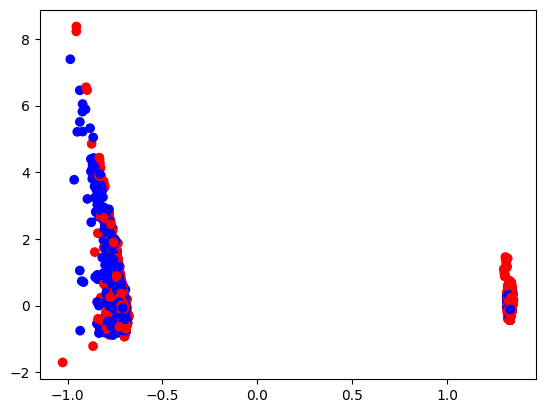

In [ ]:
plt.scatter(spaceship_titanic_factor_2c[:,0], spaceship_titanic_factor_2c[:,1], c=spaceship_titanic_point_colors)

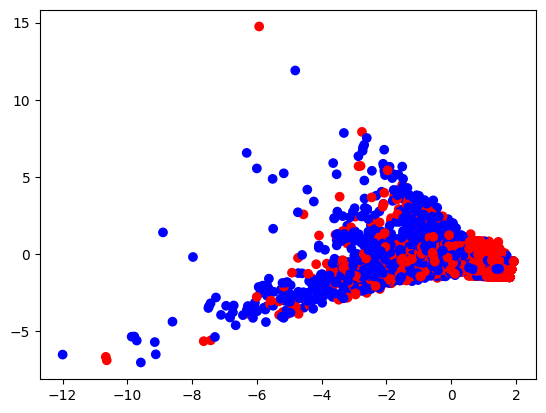

In [ ]:
plt.scatter(spaceship_titanic_randomized_pca_2c[:,0], spaceship_titanic_randomized_pca_2c[:,1], c=spaceship_titanic_point_colors)

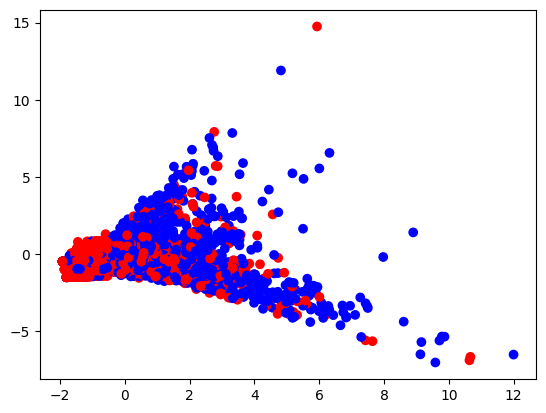

In [ ]:
plt.scatter(spaceship_titanic_kernel_pca_2c[:,0], spaceship_titanic_kernel_pca_2c[:,1], c=spaceship_titanic_point_colors)

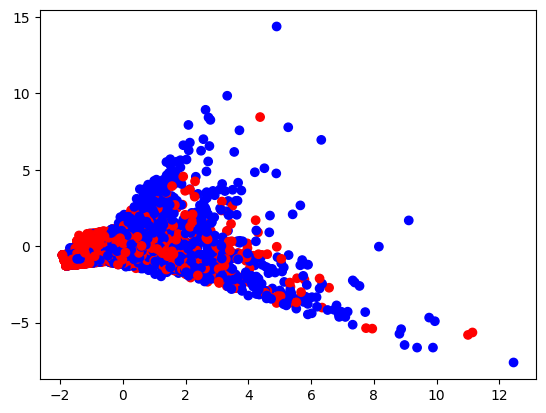

In [ ]:
plt.scatter(spaceship_titanic_incremental_pca_2c[:,0], spaceship_titanic_incremental_pca_2c[:,1], c=spaceship_titanic_point_colors)

**Spaceship Titanic - 3D**

In [ ]:
px.scatter_3d(spaceship_titanic_factor_3c, x=0, y=1, z=2, color=spaceship_titanic_point_colors)

In [ ]:
px.scatter_3d(spaceship_titanic_randomized_pca_3c, x=0, y=1, z=2, color=spaceship_titanic_point_colors)

In [ ]:
px.scatter_3d(spaceship_titanic_kernel_pca_3c, x=0, y=1, z=2, color=spaceship_titanic_point_colors)

In [ ]:
px.scatter_3d(spaceship_titanic_incremental_pca_3c, x=0, y=1, z=2, color=spaceship_titanic_point_colors)

**Student Performance**

In [ ]:
student_performance_z = np.array(student_performance_df_orig['GradeClass'].map(lambda gradeclass: 0 if gradeclass == 1.0 else 1 if gradeclass == 2.0 else 2 if gradeclass == 3.0 else 3), dtype=np.int8)
student_performance_point_colors = colors[student_performance_z]
print("Student Performance Point Colors: " + str(pd.Series(student_performance_point_colors).unique()))

Student Performance Point Colors: ['red' 'blue' 'purple' 'yellow']


**Student Performance - 2D**

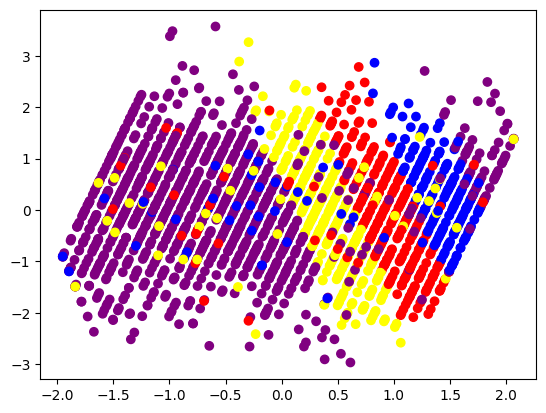

In [ ]:
plt.scatter(student_performance_factor_2c[:,0], student_performance_factor_2c[:,1], c=student_performance_point_colors)

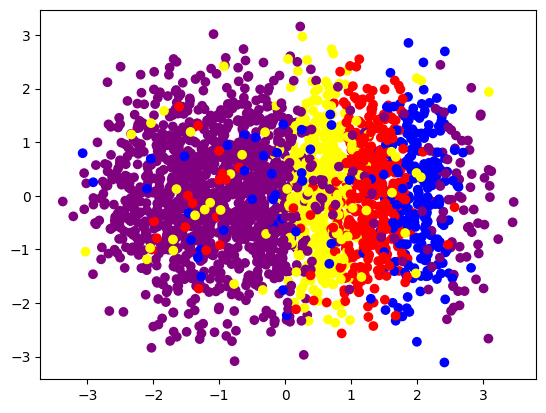

In [ ]:
plt.scatter(student_performance_randomized_pca_2c[:,0], student_performance_randomized_pca_2c[:,1], c=student_performance_point_colors)

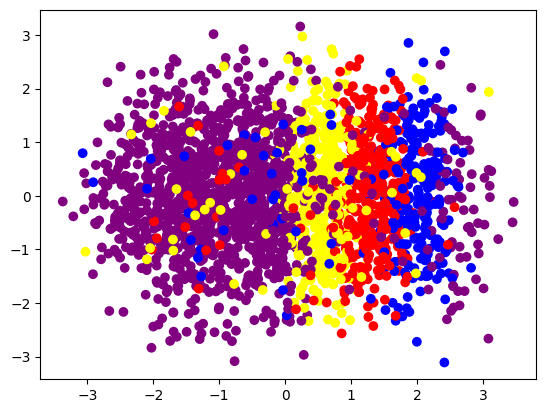

In [ ]:
plt.scatter(student_performance_kernel_pca_2c[:,0], student_performance_kernel_pca_2c[:,1], c=student_performance_point_colors)

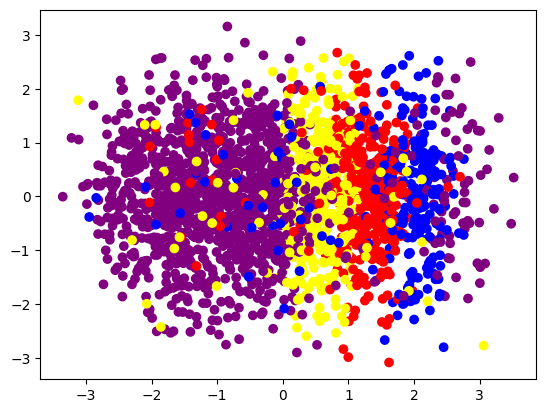

In [ ]:
plt.scatter(student_performance_incremental_pca_2c[:,0], student_performance_incremental_pca_2c[:,1], c=student_performance_point_colors)

**Student Performance - 3D**

In [ ]:
px.scatter_3d(student_performance_factor_3c, x=0, y=1, z=2, color=student_performance_point_colors)

In [ ]:
px.scatter_3d(student_performance_randomized_pca_3c, x=0, y=1, z=2, color=student_performance_point_colors)

In [ ]:
px.scatter_3d(student_performance_kernel_pca_3c, x=0, y=1, z=2, color=student_performance_point_colors)

In [ ]:
px.scatter_3d(student_performance_incremental_pca_3c, x=0, y=1, z=2, color=student_performance_point_colors)

**Vehicle Sales**

In [ ]:
vehicle_sales_z = np.array(vehicle_sales_df_orig['sellingprice'].map(lambda price: 0 if price < 20000 else 1 if price < 40000 else 2 if price < 60000 else 3), dtype=np.int8)
vehicle_sales_point_colors = colors[vehicle_sales_z]
print("Vehicle Sales Point Colors: " + str(pd.Series(vehicle_sales_point_colors).unique()))

Vehicle Sales Point Colors: ['blue' 'red' 'yellow' 'purple']


**Vehicle Sales - 2D**

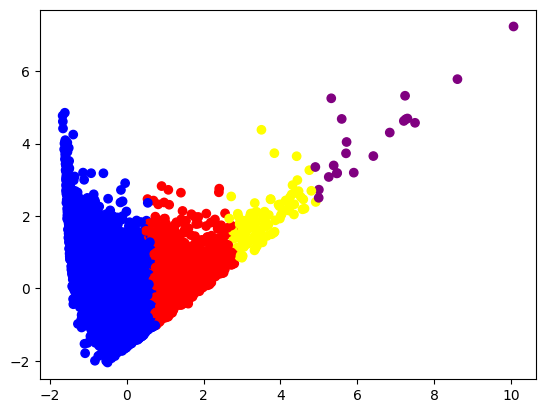

In [ ]:
plt.scatter(vehicle_sales_factor_2c[:,0], vehicle_sales_factor_2c[:,1], c=vehicle_sales_point_colors)

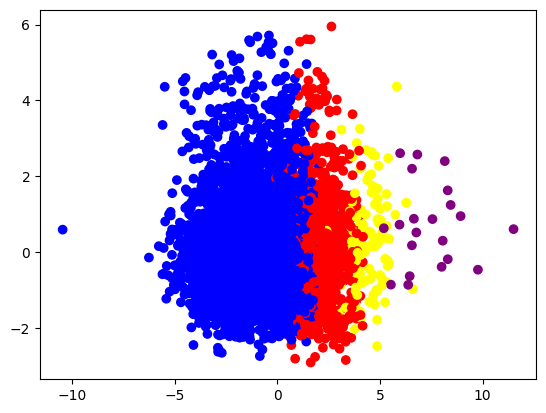

In [ ]:
plt.scatter(vehicle_sales_randomized_pca_2c[:,0], vehicle_sales_randomized_pca_2c[:,1], c=vehicle_sales_point_colors)

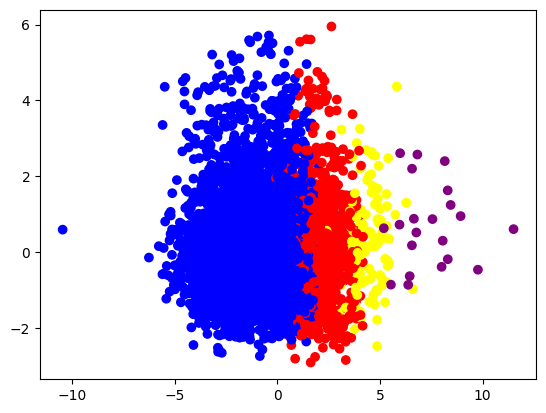

In [ ]:
plt.scatter(vehicle_sales_kernel_pca_2c[:,0], vehicle_sales_kernel_pca_2c[:,1], c=vehicle_sales_point_colors)

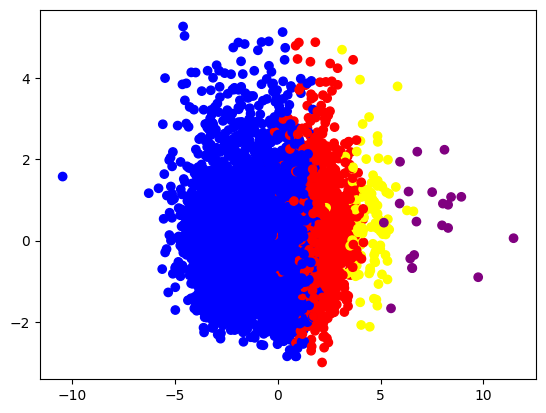

In [ ]:
plt.scatter(vehicle_sales_incremental_pca_2c[:,0], vehicle_sales_incremental_pca_2c[:,1], c=vehicle_sales_point_colors)

**Vehicle Sales - 3D**

In [ ]:
px.scatter_3d(vehicle_sales_factor_3c, x=0, y=1, z=2, color=vehicle_sales_point_colors)

In [ ]:
px.scatter_3d(vehicle_sales_randomized_pca_3c, x=0, y=1, z=2, color=vehicle_sales_point_colors)

In [ ]:
px.scatter_3d(vehicle_sales_kernel_pca_3c, x=0, y=1, z=2, color=vehicle_sales_point_colors)

In [ ]:
px.scatter_3d(vehicle_sales_incremental_pca_3c, x=0, y=1, z=2, color=vehicle_sales_point_colors)

<h1>Dimensionality Reduction: tSNE and UMAP</h1>

In [ ]:
def update_plot(df, n_components, dimensionality_reduction_method, color, **hyperparameters):
    reducer = dimensionality_reduction_method(n_components=n_components, **hyperparameters)
    df_reduced = reducer.fit_transform(df)

    if n_components == 2:
      plotter_method = px.scatter
      components = {"x": 0, "y": 1}
    elif n_components == 3:
      plotter_method = px.scatter_3d
      components = {"x": 0, "y": 1, "z": 2}
    else:
      raise Exception("Only 2 or 3 n_components supported")

    # Create an interactive scatter plot
    fig = plotter_method(df_reduced, color=color, **components,
                    #  labels={'x': 'Component 1', 'y': 'Component 2', 'z': 'Component 3'},
                     title=f'{dimensionality_reduction_method.__name__} - {str(hyperparameters)}')
    fig.show()

In [1]:
from functools import partial

def make_partial_function(*args):
  partial_function = partial(update_plot, *args)
  partial_function.__name__ = update_plot.__name__
  return partial_function

**Red Wine Quality - 2D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(red_wine_quality_df, 2, TSNE, red_wine_quality_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(red_wine_quality_df, 2, UMAP, red_wine_quality_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

**Red Wine Quality - 3D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(red_wine_quality_df, 3, TSNE, red_wine_quality_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(red_wine_quality_df, 3, UMAP, red_wine_quality_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

**Spaceship Titanic - 2D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(spaceship_titanic_df, 2, TSNE, spaceship_titanic_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(spaceship_titanic_df, 2, UMAP, spaceship_titanic_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

**Spaceship Titanic - 3D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(spaceship_titanic_df, 3, TSNE, spaceship_titanic_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(spaceship_titanic_df, 3, UMAP, spaceship_titanic_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

**Student Performance - 2D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(student_performance_df, 2, TSNE, student_performance_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(student_performance_df, 2, UMAP, student_performance_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

**Student Performance - 3D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(student_performance_df, 3, TSNE, student_performance_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(student_performance_df, 3, UMAP, student_performance_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

**Vehicle Sales - 2D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(vehicle_sales_df, 2, TSNE, vehicle_sales_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(vehicle_sales_df, 2, UMAP, vehicle_sales_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

**Vehicle Sales - 3D**

In [ ]:
# Create sliders for interactive control of hyperparameters
perplexity_slider = widgets.IntSlider(value=30, min=5, max=50, step=1, description='perplexity')
learning_rate_slider = widgets.IntSlider(value=200, min=10, max=500, step=10, description='learning_rate')

# Link sliders to the update function
widgets.interactive(make_partial_function(vehicle_sales_df, 3, TSNE, vehicle_sales_point_colors), perplexity=perplexity_slider, learning_rate=learning_rate_slider)

interactive(children=(IntSlider(value=30, description='perplexity', max=50, min=5), IntSlider(value=200, descr…

In [ ]:
# Create sliders for interactive control of hyperparameters
n_neighbors_slider = widgets.IntSlider(value=15, min=5, max=50, step=1, description='n_neighbors')
min_dist_slider = widgets.FloatSlider(value=0.1, min=0.0, max=0.9, step=0.05, description='min_dist')

# Link sliders to the update function
widgets.interactive(make_partial_function(vehicle_sales_df, 3, UMAP, vehicle_sales_point_colors), n_neighbors=n_neighbors_slider, min_dist=min_dist_slider)

interactive(children=(IntSlider(value=15, description='n_neighbors', max=50, min=5), FloatSlider(value=0.1, de…

<h1>Dimensionality Reduction: LLE, ISOMAP, and MDS</h1>

**LLE**

In [ ]:
# LocallyLinearEmbedding - 2D
lle_2c = LocallyLinearEmbedding(n_components=2, eigen_solver='dense')

red_wine_quality_lle_2c = lle_2c.fit_transform(red_wine_quality_df)
spaceship_titanic_lle_2c = lle_2c.fit_transform(spaceship_titanic_df)
student_performance_lle_2c = lle_2c.fit_transform(student_performance_df)
vehicle_sales_lle_2c = lle_2c.fit_transform(vehicle_sales_df)

# LocallyLinearEmbedding - 3D
lle_3c = LocallyLinearEmbedding(n_components=3, eigen_solver='dense')

red_wine_quality_lle_3c = lle_3c.fit_transform(red_wine_quality_df)
spaceship_titanic_lle_3c = lle_3c.fit_transform(spaceship_titanic_df)
student_performance_lle_3c = lle_3c.fit_transform(student_performance_df)
vehicle_sales_lle_3c = lle_3c.fit_transform(vehicle_sales_df)

**Isomap**

In [ ]:
# Isomap - 2D
isomap_2c = Isomap(n_components=2)

red_wine_quality_isomap_2c = isomap_2c.fit_transform(red_wine_quality_df)
spaceship_titanic_isomap_2c = isomap_2c.fit_transform(spaceship_titanic_df)
student_performance_isomap_2c = isomap_2c.fit_transform(student_performance_df)
vehicle_sales_isomap_2c = isomap_2c.fit_transform(vehicle_sales_df)

# Isomap - 3D
isomap_3c = Isomap(n_components=3)

red_wine_quality_isomap_3c = isomap_3c.fit_transform(red_wine_quality_df)
spaceship_titanic_isomap_3c = isomap_3c.fit_transform(spaceship_titanic_df)
student_performance_isomap_3c = isomap_3c.fit_transform(student_performance_df)
vehicle_sales_isomap_3c = isomap_3c.fit_transform(vehicle_sales_df)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/usr/local/lib

**MDS**

In [ ]:
# MDS - 2D
mds_2c = MDS(n_components=2)

red_wine_quality_mds_2c = mds_2c.fit_transform(red_wine_quality_df)
student_performance_mds_2c = mds_2c.fit_transform(student_performance_df)

# MDS - 3D
mds_3c = MDS(n_components=3)

red_wine_quality_mds_3c = mds_3c.fit_transform(red_wine_quality_df)
student_performance_mds_3c = mds_3c.fit_transform(student_performance_df)

<h1>Visualizations: LLE, ISOMAP, and MDS</h1>

**Red Wine Quality - 2D**

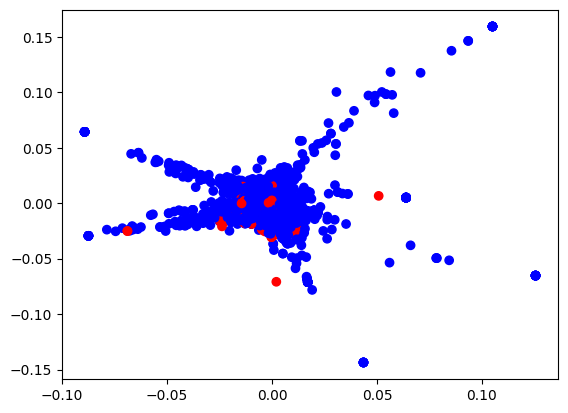

In [ ]:
plt.scatter(red_wine_quality_lle_2c[:,0], red_wine_quality_lle_2c[:,1], c=red_wine_quality_point_colors)

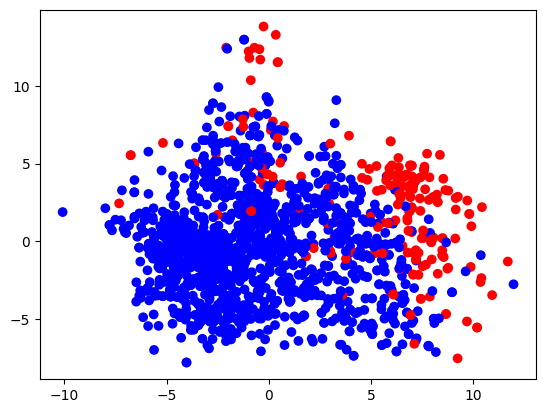

In [ ]:
plt.scatter(red_wine_quality_isomap_2c[:,0], red_wine_quality_isomap_2c[:,1], c=red_wine_quality_point_colors)

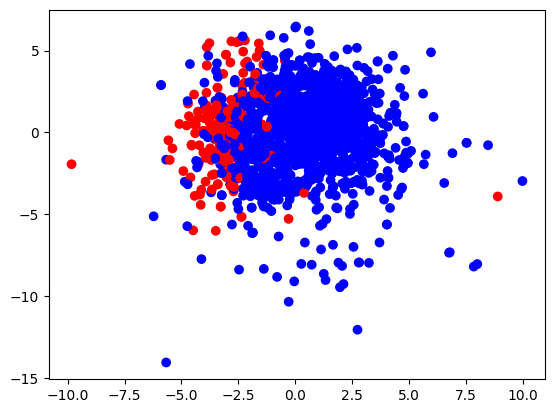

In [ ]:
plt.scatter(red_wine_quality_mds_2c[:,0], red_wine_quality_mds_2c[:,1], c=red_wine_quality_point_colors)

**Red Wine Quality - 3D**

In [ ]:
px.scatter_3d(red_wine_quality_lle_3c, x=0, y=1, z=2, color=red_wine_quality_point_colors)

In [ ]:
px.scatter_3d(red_wine_quality_isomap_3c, x=0, y=1, z=2, color=red_wine_quality_point_colors)

In [ ]:
px.scatter_3d(red_wine_quality_mds_3c, x=0, y=1, z=2, color=red_wine_quality_point_colors)

**Spaceship Titanic - 2D**

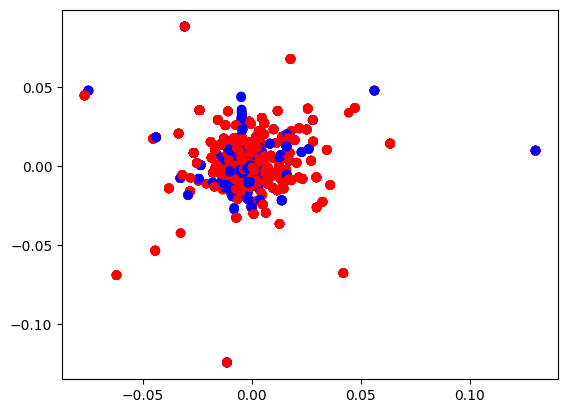

In [ ]:
plt.scatter(spaceship_titanic_lle_2c[:,0], spaceship_titanic_lle_2c[:,1], c=spaceship_titanic_point_colors)

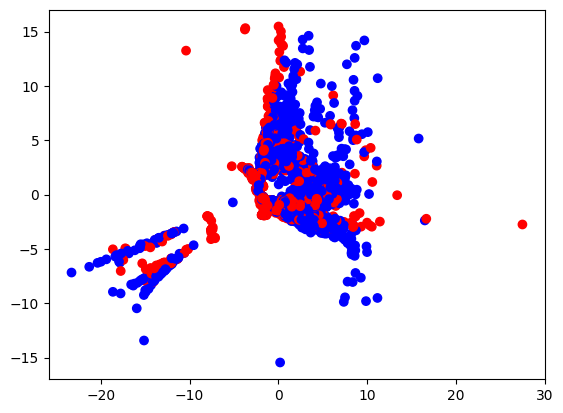

In [ ]:
plt.scatter(spaceship_titanic_isomap_2c[:,0], spaceship_titanic_isomap_2c[:,1], c=spaceship_titanic_point_colors)

**Spaceship Titanic - 3D**

In [ ]:
px.scatter_3d(spaceship_titanic_lle_3c, x=0, y=1, z=2, color=spaceship_titanic_point_colors)

In [ ]:
px.scatter_3d(spaceship_titanic_isomap_3c, x=0, y=1, z=2, color=spaceship_titanic_point_colors)

**Student Performance - 2D**

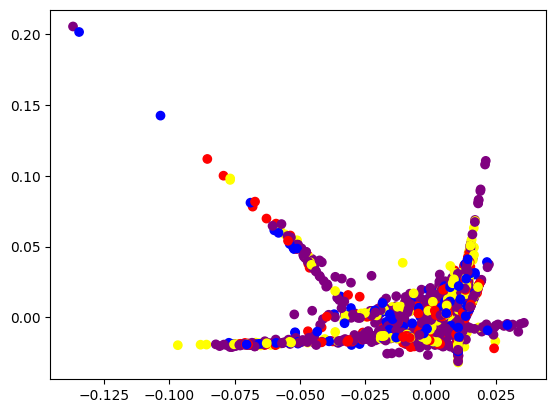

In [ ]:
plt.scatter(student_performance_lle_2c[:,0], student_performance_lle_2c[:,1], c=student_performance_point_colors)

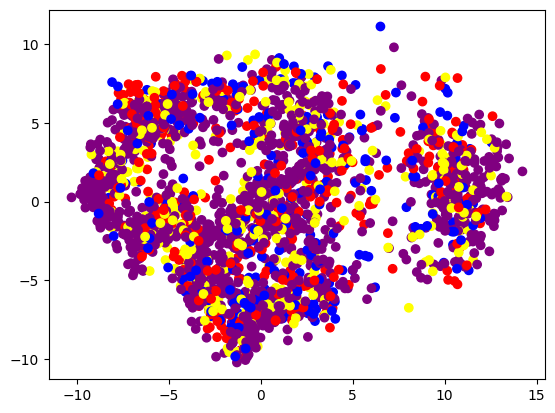

In [ ]:
plt.scatter(student_performance_isomap_2c[:,0], student_performance_isomap_2c[:,1], c=student_performance_point_colors)

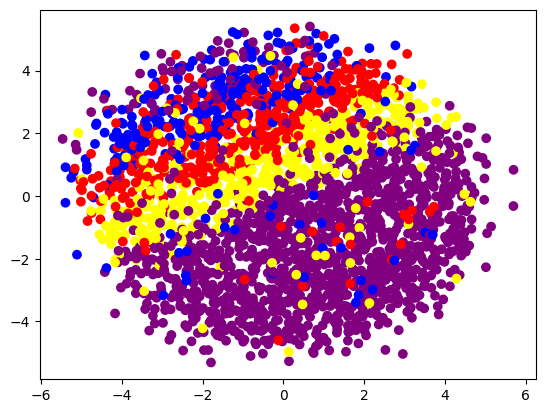

In [ ]:
plt.scatter(student_performance_mds_2c[:,0], student_performance_mds_2c[:,1], c=student_performance_point_colors)

**Student Performance - 3D**

In [ ]:
px.scatter_3d(student_performance_lle_3c, x=0, y=1, z=2, color=student_performance_point_colors)

In [ ]:
px.scatter_3d(student_performance_isomap_3c, x=0, y=1, z=2, color=student_performance_point_colors)

In [ ]:
px.scatter_3d(student_performance_mds_3c, x=0, y=1, z=2, color=student_performance_point_colors)

**Vehicle Sales - 2D**

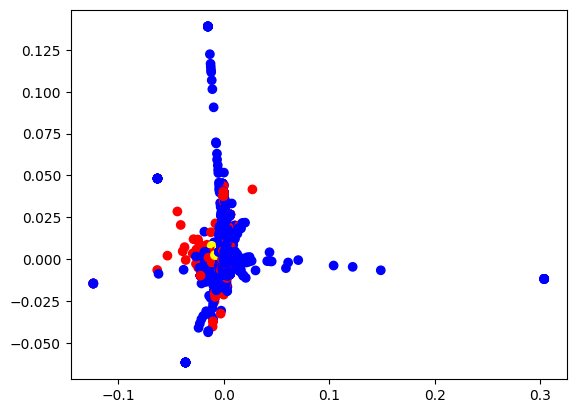

In [ ]:
plt.scatter(vehicle_sales_lle_2c[:,0], vehicle_sales_lle_2c[:,1], c=vehicle_sales_point_colors)

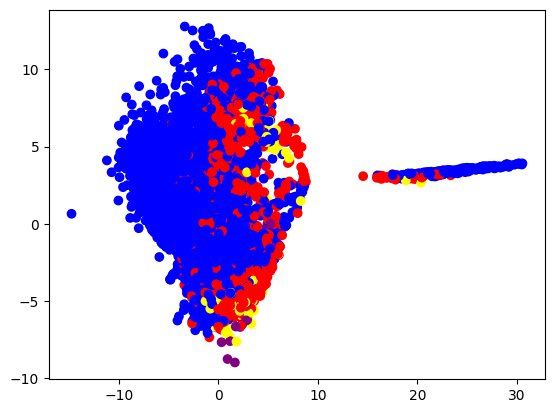

In [ ]:
plt.scatter(vehicle_sales_isomap_2c[:,0], vehicle_sales_isomap_2c[:,1], c=vehicle_sales_point_colors)

**Vehicle Sales - 3D**

In [ ]:
px.scatter_3d(vehicle_sales_lle_3c, x=0, y=1, z=2, color=vehicle_sales_point_colors)

In [ ]:
px.scatter_3d(vehicle_sales_isomap_3c, x=0, y=1, z=2, color=vehicle_sales_point_colors)

<h1>Dimensionality Reduction: AutoEncoders</h1>

In [ ]:
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredLogarithmicError

class AutoEncoders(Model):

  def __init__(self, output_units):

    super().__init__()
    self.encoder = Sequential(
        [
          Dense(32, activation="relu"),
          Dense(16, activation="relu"),
          Dense(7, activation="relu"),
          Dense(3, activation="relu"),
        ]
    )

    self.decoder = Sequential(
        [
          Dense(7, activation="relu"),
          Dense(16, activation="relu"),
          Dense(32, activation="relu"),
          Dense(output_units, activation="sigmoid")
        ]
    )

  def call(self, inputs):

    encoded = self.encoder(inputs)
    decoded = self.decoder(encoded)
    return decoded

auto_encoder = AutoEncoders(len(red_wine_quality_df.columns))

auto_encoder.compile(
    loss='mae',
    metrics=['mae'],
    optimizer='adam'
)

history = auto_encoder.fit(
    red_wine_quality_df,
    red_wine_quality_df,
    epochs=25,
    batch_size=32,
)

Epoch 1/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8920 - mae: 0.8920
Epoch 2/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7993 - mae: 0.7993
Epoch 3/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7365 - mae: 0.7365
Epoch 4/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7313 - mae: 0.7313
Epoch 5/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7138 - mae: 0.7138
Epoch 6/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7132 - mae: 0.7132
Epoch 7/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6795 - mae: 0.6795
Epoch 8/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6865 - mae: 0.6865
Epoch 9/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6695 - mae: 0.6695
Epoch 10/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6635 - mae: 0.6635
Epoch 11/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6661 - mae: 0.6661
Epoch 12/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6650 - mae: 0.6650
Epoch 13/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/ste

In [ ]:
encoder_layer = auto_encoder.get_layer('sequential_16')
red_wine_quality_autoencoded_df = pd.DataFrame(encoder_layer.predict(red_wine_quality_df))
red_wine_quality_autoencoded_df = red_wine_quality_autoencoded_df.add_prefix('feature_')
red_wine_quality_autoencoded_df

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


,feature_0,feature_1,feature_2
0,14.900125,28.109900,30.276991
1,12.183406,27.112379,28.928280
2,11.348457,24.861757,26.564024
3,3.337531,3.343339,3.824004
4,14.900125,28.109900,30.276991
...,...,...,...
1594,8.817259,27.522985,28.975698
1595,3.985798,17.991892,18.741560
1596,3.999359,15.597227,16.325386
1597,8.885771,24.133867,25.528093


In [ ]:
red_wine_quality_autoencoded_df.rename(columns={'feature_0': 'x'}, inplace=True)
red_wine_quality_autoencoded_df.rename(columns={'feature_1': 'y'}, inplace=True)
red_wine_quality_autoencoded_df.rename(columns={'feature_2': 'z'}, inplace=True)
red_wine_quality_autoencoded_df

,x,y,z
0,14.900125,28.109900,30.276991
1,12.183406,27.112379,28.928280
2,11.348457,24.861757,26.564024
3,3.337531,3.343339,3.824004
4,14.900125,28.109900,30.276991
...,...,...,...
1594,8.817259,27.522985,28.975698
1595,3.985798,17.991892,18.741560
1596,3.999359,15.597227,16.325386
1597,8.885771,24.133867,25.528093


In [ ]:
red_wine_quality_autoencoded_df.to_numpy()

array([[14.900125 , 28.1099   , 30.27699  ],
       [12.183406 , 27.11238  , 28.92828  ],
       [11.348457 , 24.861757 , 26.564024 ],
       ...,
       [ 3.9993587, 15.597227 , 16.325386 ],
       [ 8.885771 , 24.133867 , 25.528093 ],
       [ 1.9441729,  9.790588 , 10.205652 ]], dtype=float32)

In [ ]:
px.scatter_3d(red_wine_quality_autoencoded_df.to_numpy(), x=0, y=1, z=2, color=red_wine_quality_point_colors)

In [ ]:
auto_encoder = AutoEncoders(len(vehicle_sales_df.columns))

auto_encoder.compile(
    loss='mae',
    metrics=['mae'],
    optimizer='adam'
)

history = auto_encoder.fit(
    vehicle_sales_df,
    vehicle_sales_df,
    epochs=25,
    batch_size=32,
)

Epoch 1/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8383 - mae: 0.8383
Epoch 2/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7405 - mae: 0.7405
Epoch 3/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7167 - mae: 0.7167
Epoch 4/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7115 - mae: 0.7115
Epoch 5/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7058 - mae: 0.7058
Epoch 6/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7053 - mae: 0.7053
Epoch 7/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7070 - mae: 0.7070
Epoch 8/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7082 - mae: 0.7082
Epoch 9/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6994 - mae: 0.6994
Epoch 10/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7059 - mae: 0.7059
Epoch 11/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7004 - mae: 0.7004
Epoch 12/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7039 - mae: 0.7039
Epoch 13/25
313/313 ━━━━━

In [ ]:
encoder_layer = auto_encoder.get_layer('sequential_18')
vehicle_sales_autoencoded_df = pd.DataFrame(encoder_layer.predict(vehicle_sales_df))
vehicle_sales_autoencoded_df = vehicle_sales_autoencoded_df.add_prefix('feature_')
vehicle_sales_autoencoded_df

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


,feature_0,feature_1,feature_2
0,0.000000,0.000000,5.411199
1,0.000000,0.000000,6.393785
2,0.289589,0.961734,1.748032
3,0.000000,0.000000,10.923699
4,0.000000,0.000000,16.837070
...,...,...,...
9995,0.000000,0.000000,8.808452
9996,0.000000,0.000000,6.016931
9997,0.000000,0.000000,3.817108
9998,0.000000,0.000000,28.825804


In [ ]:
vehicle_sales_autoencoded_df.rename(columns={'feature_0': 'x'}, inplace=True)
vehicle_sales_autoencoded_df.rename(columns={'feature_1': 'y'}, inplace=True)
vehicle_sales_autoencoded_df.rename(columns={'feature_2': 'z'}, inplace=True)
vehicle_sales_autoencoded_df

,x,y,z
0,0.000000,0.000000,5.411199
1,0.000000,0.000000,6.393785
2,0.289589,0.961734,1.748032
3,0.000000,0.000000,10.923699
4,0.000000,0.000000,16.837070
...,...,...,...
9995,0.000000,0.000000,8.808452
9996,0.000000,0.000000,6.016931
9997,0.000000,0.000000,3.817108
9998,0.000000,0.000000,28.825804


In [ ]:
px.scatter_3d(vehicle_sales_autoencoded_df.to_numpy(), x=0, y=1, z=2, color=vehicle_sales_point_colors)